# Run LLM agentic application

In [1]:
# Import main packages
import pandas as pd
import os
import gc
import json
import re
from datetime import datetime

# Define directories
def find_directory_upwards(dir_name):
    """
    Find the absolute path to a directory with the given name by searching upwards
    from the current notebook's directory.

    Parameters:
    dir_name (str): The name of the directory to find.

    Returns:
    str: The absolute path to the directory if found, otherwise None.
    """
    # Get the current notebook's directory
    current_dir = os.getcwd()
    
    while True:
        # Check if the directory exists in the current directory
        potential_path = os.path.join(current_dir, dir_name)
        if os.path.isdir(potential_path):
            return potential_path
        
        # Move to the parent directory
        parent_dir = os.path.abspath(os.path.join(current_dir, os.pardir))
        
        # If the current directory is the root directory, stop searching
        if current_dir == parent_dir:
            break
        
        current_dir = parent_dir
    
    # If the directory is not found, return None
    return None

code_dir = find_directory_upwards('codes')
raw_data_dir = find_directory_upwards('raw_data')
int_data_dir = find_directory_upwards('int_data')
final_data_dir = find_directory_upwards('final_data')
output_dir = find_directory_upwards('output')
ucctextextract_dir = find_directory_upwards('ucc_text_extract')

print(code_dir)
# print(raw_data_dir)
print(int_data_dir)
print(output_dir)
print(ucctextextract_dir)

/home/sosajuanbautista/aeai-filestore/projects/agentic/codes
/home/sosajuanbautista/aeai-filestore/projects/agentic/int_data
/home/sosajuanbautista/aeai-filestore/projects/agentic/output
/home/sosajuanbautista/aeai-filestore/projects/ucc_text_extract


/home/sosajuanbautista/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## Retrieve initial search results

In [2]:
# Load JSON with search results for commodities
path = os.path.join(int_data_dir, 'commodity_price_sources', 'commodity_tavily_search_results.json')
with open(path, 'r') as file:
    data = json.load(file)
print(len(data))
print(data.keys())

20
dict_keys(['Rotary tiller or power tiller', 'Farming excavator', 'Mowers', 'Track excavators', 'Forklifts', 'Automobiles or cars', 'Battery energy storage control and management system', 'Solar power plants', 'General tool kits', 'Trim or molding tools', 'Gabion block', 'Toothbrush or tumbler holder', 'Computer server', 'Notebook computer', 'Desktop computer', 'Personal computer', 'Photocopiers', 'Multifunction machines', 'Office product equipment and stationery consumable', 'Inkjet printer for commercial printing applications'])


In [3]:
data['Farming excavator']

{'commodity_code': '21101526',
 'search_results': [{'query': 'Farming excavator blue book',
   'follow_up_questions': None,
   'answer': None,
   'images': [],
   'results': [{'title': 'Farm Equipment Guide - Farmers Hot Line',
     'url': 'https://www.farmershotline.com/tractor-price-guides/farm-equipment-guide',
     'content': 'Farm Equipment Guide | Farmers Hot Line Farm Equipment Guide If you appraise, evaluate, repair, identify or own farm equipment, this\xa0Hot Line Farm Equipment Guide\xa0will serve as your "blue book", and is your single source to thousands of prices, serial numbers and specifications on over 100 top manufacturers! Hot Line Farm Equipment Guide includes; optional equipment pricing. With the\xa0Farm Equipment Guide\xa0you will get real-world pricing that shows what the equipment is worth on the auction block and what you can expect in actual value. By using\xa0Farm Equipment Guide\xa0you can get the best price for your equipment and accurately determine the val

In [4]:
# Add the query to the inner most dictionary
for commodity in data.keys():
    for commodity_data in data[commodity]['search_results']:
        query = commodity_data['query']
        for result in commodity_data['results']:
            # Add the query to the content
            result['query'] = query

In [5]:
# Load JSON with search results for products
path = os.path.join(int_data_dir, 'product_price_sources', 'product_tavily_search_results.json')
with open(path, 'r') as file:
    data_products = json.load(file)
print(len(data_products))
print(data_products.keys())

20
dict_keys(['E-Z-GO RXV Elite Golf Cart', 'B. Braun Infusomat Space Infusion Pump', 'CLUB CAR DS Golf cart', 'Club Car IQ Electric Electric Golf Car', 'Yale GC050VX Forklift', 'Chevrolet Traverse SUV', 'Lenovo ThinkPad T14s G2 Notebook computer', 'Ford E-150 Cargo Van', 'Kubota LA525 Front Loader', 'Intek Strength Pro Steel Dumbbell Pair Dumbbells', 'Dell PowerEdge R740 Computer server', 'Park Cottage RV Recreational Vehicle', 'E-Z-GO RXV-G Golf cart', 'Xerox DocuMate 262 Document Scanner', 'Chrysler Voyager LX Minivan', 'Toyota 8FGCU25 Forklift', 'Land Pride BB1260 Box Scraper', 'Raymond 740R45TT Reach Forklift', 'EZGO TXT PDS Golf Cart', 'Land Pride RCR1260 Rotary Cutter'])


In [6]:
# Add the query to the inner most dictionary
for product in data_products.keys():
    for product_data in data_products[product]['search_results']:
        query = product_data['query']
        for result in product_data['results']:
            # Add the query to the content
            result['query'] = query

## Some analysis

In [7]:
import tiktoken
enc = tiktoken.encoding_for_model("gpt-4o-mini")

# Calcuate length of content over length of raw_content, on average for all results
lengths_raw_content = []
lengths_content = []
tokens_raw_content = []
tokens_content = []
length_ratios = []

for commodity in data.keys():
    for commodity_data in data[commodity]['search_results']:
        for result in commodity_data['results']:
            # Remove repeated newlines
            result['content'] = re.sub(r'\n+', '\n', result['content'])
            result['raw_content'] = re.sub(r'\n+', '\n', result['raw_content'])

            # Keep track of stuff
            lengths_raw_content.append(len(result['raw_content']))
            tokens_raw_content.append(len(enc.encode(result['raw_content'])))
            lengths_content.append(len(result['content']))
            tokens_content.append(len(enc.encode(result['content'])))
            length_ratios.append(len(result['content']) / len(result['raw_content']))

factor = 0.075 / 1000000 / 4
print(sum(lengths_content) / len(lengths_content))
print('Avg length of raw content', sum(lengths_raw_content) / len(lengths_raw_content))
print('Implied cost of average', round(sum(lengths_raw_content) / len(lengths_raw_content) * factor,4)) # 0.075 per 1M input tokes
print('Total sum of raw content', sum(lengths_raw_content))
print('Implied cost of all this input tokens', round(sum(lengths_raw_content)* factor,4)) # 0.075 per 1M input tokes
print('Avg length of brief content', sum(length_ratios) / len(length_ratios))
print('\n')

print('Avg token of raw content', sum(tokens_raw_content) / len(tokens_raw_content))
print('Total sum of tokens in raw content', sum(tokens_raw_content))


586.9246861924686
Avg length of raw content 14790.774058577406
Implied cost of average 0.0003
Total sum of raw content 3534995
Implied cost of all this input tokens 0.0663
Avg length of brief content 0.1118290168147639


Avg token of raw content 3475.142259414226
Total sum of tokens in raw content 830559


In [8]:
import numpy as np
import pandas as pd

# Calculate the deciles
deciles = np.percentile(lengths_raw_content, np.arange(0, 110, 10))

# Create a DataFrame to display the deciles
decile_table = pd.DataFrame({
    'Decile': [f'{i}th' for i in range(0, 110, 10)],
    'Value': deciles
})

# Print the table
print(decile_table)

   Decile     Value
0     0th    1545.0
1    10th    2169.6
2    20th    3072.6
3    30th    3721.0
4    40th    4477.2
5    50th    6593.0
6    60th    8841.0
7    70th   11569.0
8    80th   17044.2
9    90th   31148.4
10  100th  205543.0


68290


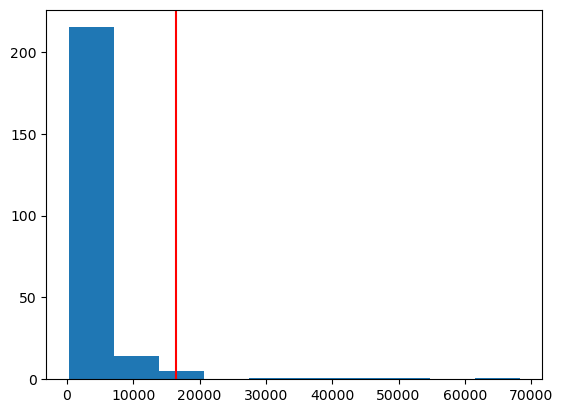

In [9]:
print(max(tokens_raw_content))

import matplotlib.pyplot as plt
max_tokens_40mini = 16384
plt.hist(tokens_raw_content)
plt.axvline(x=max_tokens_40mini, color='red')

In [10]:
import numpy as np
import pandas as pd

# Calculate the deciles
deciles = np.percentile(tokens_raw_content, np.arange(0, 110, 10))

# Create a DataFrame to display the deciles
decile_table = pd.DataFrame({
    'Decile': [f'{i}th' for i in range(0, 110, 10)],
    'Value': deciles
})

# Print the table
print(decile_table)

   Decile    Value
0     0th    288.0
1    10th    483.8
2    20th    644.0
3    30th    852.0
4    40th   1065.2
5    50th   1501.0
6    60th   1915.8
7    70th   2588.6
8    80th   3589.2
9    90th   7069.2
10  100th  68290.0


In [11]:
# Show the text with the largest amount of characters
# Initialize a variable to store the element with the most characters
largest_element = ''
max_length = 0

for commodity in data.keys():
    for commodity_data in data[commodity]['search_results']:
        for result in commodity_data['results']:
            if len(result['raw_content']) > max_length:
                max_length = len(result['raw_content'])
                largest_element = result

# Display the result
# print(f"The element with the largest amount of characters is: {largest_element}")
print(f"Length of the element: {max_length}")
print(largest_element['url'])
print(largest_element['raw_content'])


Length of the element: 205543
https://pubdocs.worldbank.org/en/849341611761898393/WorldBank-CSP-Report-Concentrating-Solar-Power-Clean-Power-on-Demand-24-7-FINAL.pdf
CONCENTRATING SOLAR POWER CLEAN POWER ON DEMAND 24/7 CONCENTRATING SOLAR POWER: CLEAN POWER ON DEMAND 24/7 2 © 2020 International Bank for Reconstruction and Development / The World Bank 1818 H Street NW | Washington DC 20433 | USA 202-473-1000 | www.worldbank.org This work is a product of the staff of the World Bank with external contributions. The findings, interpretations, and conclusions expressed in this work do not necessarily reflect the views of the World Bank, its Board of Executive Directors, or the governments they represent. The World Bank does not guarantee the accuracy of the data included in this work. The boundaries, colors, denominations, and other information shown on any map in this work do not imply any judgment on the part of the World Bank concerning the legal status of any territory or the endorsemen

In [12]:
# # RESTRICT CHARACTERS OF RAW CONTENT
# max_characters = 100000

# for commodity in data.keys():
#     for commodity_data in data[commodity]['search_results']:
#         for result in commodity_data['results']:
#             if len(result['raw_content']) > max_characters:
#                 result['raw_content'] = result['raw_content'][:max_characters]

## Get sample

In [13]:
# # Optional: Create a sample of search results to evaluate
# commodity = 'Rotary tiller or power tiller'
# commodity_data = data[commodity]

# initial_results_to_evaluate = []

# for search_term in commodity_data['search_results']:
#     query = search_term['query']
#     for r in search_term['results']:
#         r_copy = {'query': query}
#         r_copy.update(r)
#         initial_results_to_evaluate.append(r_copy)

# def remove_duplicates(dict_list):
#     seen_urls = set()
#     unique_dicts = []
    
#     for d in dict_list:
#         url = d['url']
#         if url not in seen_urls:
#             unique_dicts.append(d)  # Add the dictionary if the URL hasn't been seen
#             seen_urls.add(url)  # Mark the URL as seen
    
#     return unique_dicts

# initial_results_to_evaluate = remove_duplicates(initial_results_to_evaluate)

# print(len(initial_results_to_evaluate))
# initial_results_to_evaluate

## Calculate costs - Commodities

In [12]:
data

{'Rotary tiller or power tiller': {'commodity_code': '21101517',
  'search_results': [{'query': 'Rotary tiller or power tiller blue book',
    'follow_up_questions': None,
    'answer': None,
    'images': [],
    'results': [{'title': "Rototiller Buyer's Guide - Harvest to Table",
      'url': 'https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/',
      'content': 'Rototiller Buyer’s Guide Rototiller manufacturers make tillers in all shapes and sizes, from small, light models to large machines with good-sized motors and big rotating tines. If you have a small home garden, an electric corded rototiller should be adequate. If you have a large garden or heavy clay soil, you’ll need a large rototiller with a powerful engine. No matter what size garden or yard you have, be sure to choose a rototiller that is powerful enough to do the job. Here’s our guide to help you buy a rototiller: What are rototillers used for? What is a rototiller? rototillers Rototiller-cultivator 

In [15]:
# # Average length of query
# lengths_query = []

# for commodity in data.keys():
#     for commodity_data in data[commodity]['search_results']:
#         for result in commodity_data['results']:
#              lengths_query.append(len(result['query']))

# print(sum(lengths_query) / len(lengths_query))

In [13]:
# Create a dictionary where the keys are the commodities and the values are the search results
complete_search_results_to_evaluate_commodities = {}

def remove_duplicates(dict_list):
    seen_urls = set()
    unique_dicts = []
    
    for d in dict_list:
        url = d['url']
        if url not in seen_urls:
            unique_dicts.append(d)  # Add the dictionary if the URL hasn't been seen
            seen_urls.add(url)  # Mark the URL as seen
    
    return unique_dicts

for commodity in list(data.keys()):
    search_results = []
    for commodity_data in data[commodity]['search_results']:
        # print(commodity_data['results'])
        for result in commodity_data['results']:
            search_results.append(result)
    complete_search_results_to_evaluate_commodities[commodity] = search_results
    complete_search_results_to_evaluate_commodities[commodity] = remove_duplicates(complete_search_results_to_evaluate_commodities[commodity])

complete_search_results_to_evaluate_commodities

{'Rotary tiller or power tiller': [{'title': "Rototiller Buyer's Guide - Harvest to Table",
   'url': 'https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/',
   'content': 'Rototiller Buyer’s Guide Rototiller manufacturers make tillers in all shapes and sizes, from small, light models to large machines with good-sized motors and big rotating tines. If you have a small home garden, an electric corded rototiller should be adequate. If you have a large garden or heavy clay soil, you’ll need a large rototiller with a powerful engine. No matter what size garden or yard you have, be sure to choose a rototiller that is powerful enough to do the job. Here’s our guide to help you buy a rototiller: What are rototillers used for? What is a rototiller? rototillers Rototiller-cultivator buying tips A. A rear-tine, gas-powered rototiller can dig 8 to 10 inches deep. Rototiller Hedge Trimmer Buyer’s Guide',
   'score': 0.99394965,
   'raw_content': "\nLatest stories\nHow to Grow Mig

In [14]:
# Count the number of results to evaluate for each commodity
num_results = {commodity: len(results) for commodity, results in complete_search_results_to_evaluate_commodities.items()}
# Calulcate the average number of results to evaluate
avg_num_results = sum(num_results.values()) / len(num_results)
print(avg_num_results)
num_results

10.65


{'Rotary tiller or power tiller': 9,
 'Farming excavator': 12,
 'Mowers': 15,
 'Track excavators': 8,
 'Forklifts': 13,
 'Automobiles or cars': 10,
 'Battery energy storage control and management system': 13,
 'Solar power plants': 14,
 'General tool kits': 7,
 'Trim or molding tools': 9,
 'Gabion block': 12,
 'Toothbrush or tumbler holder': 3,
 'Computer server': 12,
 'Notebook computer': 7,
 'Desktop computer': 9,
 'Personal computer': 11,
 'Photocopiers': 14,
 'Multifunction machines': 11,
 'Office product equipment and stationery consumable': 14,
 'Inkjet printer for commercial printing applications': 10}

In [15]:
from llm_agentic_app_for_price_sources import calculate_costs, calculate_tavily_search_cost

print("Values top 20 commodities (with justification)")
total_costs = 0
n_tavily_api_calls = 0
for commodity in complete_search_results_to_evaluate_commodities.keys():
    cost_dict = calculate_costs(
        search_results_to_evaluate=complete_search_results_to_evaluate_commodities[commodity], item_to_search=commodity, item_type='commodity',
        min_similarity_score=None, use_raw_content=True, include_justification=True,
        justification_length=300, n_refined_search_terms=3, max_iterations=3, max_content_length=100000,
        refined_search_term_length=60, max_results_per_search_term=3, verbose=False
    )
    total_costs += cost_dict['total_token_cost']
    n_tavily_api_calls += cost_dict['n_tavily_api_calls']

print("Total Tavily searches for this batch:", n_tavily_api_calls)
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls))

n_commodity_categories=100

print(f"Total Tavily searches for {n_commodity_categories} commodity categories (inlcuding initial calls):", (n_tavily_api_calls/20*n_commodity_categories)+n_commodity_categories)
print("Implied cost:", calculate_tavily_search_cost((n_tavily_api_calls/20*n_commodity_categories)+n_commodity_categories))

print("Total estimated cost of tokens in USD:", round(total_costs,3))
print(f"Total cost for {n_commodity_categories} commodity categories in USD:", round(total_costs/20*n_commodity_categories,3))

print("Total cost overall:", round(total_costs/20*n_commodity_categories + calculate_tavily_search_cost((n_tavily_api_calls/20*n_commodity_categories)+n_commodity_categories),2))

Values top 20 commodities (with justification)
Total Tavily searches for this batch: 40
Implied cost: 0
Total Tavily searches for 100 commodity categories (inlcuding initial calls): 300.0
Implied cost: 0
Total estimated cost of tokens in USD: 0.385
Total cost for 100 commodity categories in USD: 1.927
Total cost overall: 1.93


In [19]:
from llm_agentic_app_for_price_sources import calculate_costs, calculate_tavily_search_cost

print("Values top 20 commodities (with justification)")
total_costs = 0
n_tavily_api_calls = 0
for commodity in complete_search_results_to_evaluate_commodities.keys():
    cost_dict = calculate_costs(
        search_results_to_evaluate=complete_search_results_to_evaluate_commodities[commodity], item_to_search=commodity, item_type='commodity',
        min_similarity_score=None, use_raw_content=True, include_justification=True,
        justification_length=300, n_refined_search_terms=3, max_iterations=3, max_content_length=100000,
        refined_search_term_length=60, max_results_per_search_term=3, verbose=False
    )
    total_costs += cost_dict['total_token_cost']
    n_tavily_api_calls += cost_dict['n_tavily_api_calls']

print("Total Tavily searches for this batch:", n_tavily_api_calls)
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls))

n_commodity_categories=300

print(f"Total Tavily searches for {n_commodity_categories} commodity categories (inlcuding initial calls):", (n_tavily_api_calls/20*n_commodity_categories)+(n_commodity_categories-20))
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls/20*n_commodity_categories))

print("Total estimated cost of tokens in USD:", round(total_costs,2))
print(f"Total cost for {n_commodity_categories} commodity categories in USD:", round(total_costs/20*n_commodity_categories,2))

print("Total cost overall:", round(total_costs/20*n_commodity_categories + calculate_tavily_search_cost((n_tavily_api_calls/20*n_commodity_categories)+(n_commodity_categories-20)),2))

Values top 20 commodities (with justification)
Total Tavily searches for this batch: 40
Implied cost: 0
Total Tavily searches for 300 commodity categories (inlcuding initial calls): 880.0
Implied cost: 0
Total estimated cost of tokens in USD: 0.39
Total cost for 300 commodity categories in USD: 5.78
Total cost overall: 5.78


In [20]:
cost_dict

{'total_input_tokens': 55321.0,
 'total_output_tokens': 2270.0,
 'total_token_cost': 0.009660150000000001,
 'n_tavily_api_calls': 2}

## Calculate costs - Products

In [21]:
data_products

{'E-Z-GO RXV Elite Golf Cart': {'make': 'E-Z-GO',
  'model': 'RXV Elite',
  'equipment_type': 'Golf Cart',
  'search_results': [{'query': 'E-Z-GO RXV Elite Golf Cart blue book',
    'follow_up_questions': None,
    'answer': None,
    'images': [],
    'results': [{'title': 'Prestige Golf Cars | Golf Cart Dealer in Murrieta CA, Las Vegas NV ...',
      'url': 'https://prestigegolfcars.com/',
      'content': 'Prestige Golf Cars is proud to be your premier golf cart dealer in Murrieta CA, Las Vegas NV, and Hurricane, UT. E-Z-GO, Club Car, Cushman, Yamaha and More. ... 2014 E-Z-GO Freedom RXV Elite 3.0 Four Passenger Lithium Golf Cart. $7,299 $6,799 Monthly Payments Disclaimer ×. The values presented on this site are for estimation purposes only.',
      'score': 0.99743915,
      'raw_content': 'Click Here to view our Golf Cars currently on Clearance!\nClick Here to view our Golf Cars currently on Clearance!\nPrestige Golf Cars\nAffordable Golf Carts in Southern California / Southern Ne

In [22]:
# Create a dictionary where the keys are the products and the values are the search results
complete_search_results_to_evaluate_products = {}

def remove_duplicates(dict_list):
    seen_urls = set()
    unique_dicts = []
    
    for d in dict_list:
        url = d['url']
        if url not in seen_urls:
            unique_dicts.append(d)  # Add the dictionary if the URL hasn't been seen
            seen_urls.add(url)  # Mark the URL as seen
    
    return unique_dicts

for product in list(data_products.keys()):
    search_results = []
    for product_data in data_products[product]['search_results']:
        # print(product_data['results'])
        for result in product_data['results']:
            search_results.append(result)
    complete_search_results_to_evaluate_products[product] = search_results
    complete_search_results_to_evaluate_products[product] = remove_duplicates(complete_search_results_to_evaluate_products[product])

complete_search_results_to_evaluate_products

{'E-Z-GO RXV Elite Golf Cart': [{'title': 'Prestige Golf Cars | Golf Cart Dealer in Murrieta CA, Las Vegas NV ...',
   'url': 'https://prestigegolfcars.com/',
   'content': 'Prestige Golf Cars is proud to be your premier golf cart dealer in Murrieta CA, Las Vegas NV, and Hurricane, UT. E-Z-GO, Club Car, Cushman, Yamaha and More. ... 2014 E-Z-GO Freedom RXV Elite 3.0 Four Passenger Lithium Golf Cart. $7,299 $6,799 Monthly Payments Disclaimer ×. The values presented on this site are for estimation purposes only.',
   'score': 0.99743915,
   'raw_content': 'Click Here to view our Golf Cars currently on Clearance!\nClick Here to view our Golf Cars currently on Clearance!\nPrestige Golf Cars\nAffordable Golf Carts in Southern California / Southern Nevada / Utah\nMurrieta, CA\n951-695-2720\nLas Vegas, NV\n702-308-4567\nSummerlin, NV\n702-854-9044\nMesquite, NV\n725-296-2862\nHurricane, UT\n435-406-7906\nE-Z-GOCalifornia & Nevada\nCUSHMANCalifornia & Nevada\nWESTERNCalifornia & Nevada\nCLUB C

In [23]:
# Count the number of results to evaluate for each product
num_results = {product: len(results) for product, results in complete_search_results_to_evaluate_products.items()}
# Calulcate the average number of results to evaluate
avg_num_results = sum(num_results.values()) / len(num_results)
print(avg_num_results)
num_results

12.7


{'E-Z-GO RXV Elite Golf Cart': 14,
 'B. Braun Infusomat Space Infusion Pump': 14,
 'CLUB CAR DS Golf cart': 13,
 'Club Car IQ Electric Electric Golf Car': 14,
 'Yale GC050VX Forklift': 13,
 'Chevrolet Traverse SUV': 15,
 'Lenovo ThinkPad T14s G2 Notebook computer': 15,
 'Ford E-150 Cargo Van': 14,
 'Kubota LA525 Front Loader': 12,
 'Intek Strength Pro Steel Dumbbell Pair Dumbbells': 7,
 'Dell PowerEdge R740 Computer server': 14,
 'Park Cottage RV Recreational Vehicle': 12,
 'E-Z-GO RXV-G Golf cart': 12,
 'Xerox DocuMate 262 Document Scanner': 14,
 'Chrysler Voyager LX Minivan': 14,
 'Toyota 8FGCU25 Forklift': 10,
 'Land Pride BB1260 Box Scraper': 12,
 'Raymond 740R45TT Reach Forklift': 10,
 'EZGO TXT PDS Golf Cart': 12,
 'Land Pride RCR1260 Rotary Cutter': 13}

In [26]:
from llm_agentic_app_for_price_sources import calculate_costs, calculate_tavily_search_cost

print("Values top 20 products (with justification)")
total_costs = 0
n_tavily_api_calls = 0
for product in complete_search_results_to_evaluate_products.keys():
    cost_dict = calculate_costs(
        search_results_to_evaluate=complete_search_results_to_evaluate_products[product], item_to_search=product, item_type='product',
        min_similarity_score=None, use_raw_content=True, include_justification=True,
        justification_length=300, n_refined_search_terms=3, max_iterations=3, max_content_length=100000,
        refined_search_term_length=60, max_results_per_search_term=3, verbose=False
    )
    total_costs += cost_dict['total_token_cost']
    n_tavily_api_calls += cost_dict['n_tavily_api_calls']

print("Total Tavily searches for this batch:", n_tavily_api_calls)
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls))

n_product_categories=10000

print(f"Total Tavily searches for {n_product_categories} product categories (inlcuding initial calls):", (n_tavily_api_calls/20*n_product_categories)+n_product_categories)
print("Implied cost:", calculate_tavily_search_cost((n_tavily_api_calls/20*n_product_categories)+n_product_categories))

print("Total estimated cost of tokens in USD:", round(total_costs,3))
print(f"Total cost for {n_product_categories} product categories in USD:", round(total_costs/20*n_product_categories,3))

print("Total cost overall:", round(total_costs/20*n_product_categories + calculate_tavily_search_cost((n_tavily_api_calls/20*n_product_categories)+n_product_categories),2))

Values top 20 products (with justification)
Total Tavily searches for this batch: 40
Implied cost: 0
Total Tavily searches for 10000 product categories (inlcuding initial calls): 30000.0
Implied cost: 220
Total estimated cost of tokens in USD: 0.178
Total cost for 10000 product categories in USD: 89.126
Total cost overall: 309.13
